<a href="https://colab.research.google.com/github/n4spr/us-x-elections/blob/main/Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


#1. Set up.


   ## 1.1. Installing required modules.


In [1]:
#!pip install PyStemmer
!pip install vaderSentiment

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.0/126.0 kB 3.8 MB/s eta 0:00:00


## 1.2. Import modules.




In [2]:
import os
import numpy as np
import pandas as pd
import networkx as nx
import re
import json
import ast
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import plotly.io as pio
import plotly.graph_objects as go
from matplotlib.colors import LinearSegmentedColormap
from sklearn.feature_extraction.text import CountVectorizer
from collections import Counter
from scipy.stats import chisquare, chi2, gaussian_kde
import spacy
from wordcloud import WordCloud, STOPWORDS
from PIL import Image
from matplotlib.colors import LinearSegmentedColormap
#import random
#from matplotlib.patches import FancyArrowPatch
#import Stemmer
pio.templates.default = "ggplot2"
plt.style.use('ggplot')
!python -m spacy download en_core_web_sm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 25.2 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.



##1.3. Mount google drive.


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive




---


#2. Preprocessing the data and dataframe creation.



> Dataset taken from: https://github.com/sinking8/usc-x-24-us-election?tab=readme-ov-file


> Ref to the arxiv explanation paper: https://arxiv.org/abs/2411.00376



```
This dataset is licensed under the Creative Commons Attribution-NonCommercial-ShareAlike 4.0 International Public License (CC BY-NC-SA 4.0).
```
I chose to analyse 10 chunks of this dataset ≈ 300,000 tweets ≈ 800 MB taken at random from the part1 folder. \
Chunks taken: 4, 9, 10, 11, 14, 15, 16, 17, 19, 20


In [4]:
def preprocess_user(user_data_raw):
    try:
        user_data_cleaned = user_data_raw.replace("'", '"')
        user_data_cleaned = user_data_cleaned.replace("None", "null")
        user_data_cleaned = user_data_cleaned.replace("False", "false")
        user_data_cleaned = user_data_cleaned.replace("True", "true")
        user_data_cleaned = re.sub(r"(datetime\.datetime\([^\)]+\))", r'"\1"', user_data_cleaned)
        # Parse as JSON
        return json.loads(user_data_cleaned)
    except Exception as e:
        # print(f"Error processing user data: {e}")
        return {}

In [5]:
def extract_user_attributes(row):
    user_data = preprocess_user(row)
    return {
        #"created": user_data.get("created"),
        "friendsCount": user_data.get("friendsCount"),
        "followersCount": user_data.get("followersCount"),
        "statusesCount": user_data.get("statusesCount"),
        "location": user_data.get("location"),
        "id": user_data.get("id_str"),
        "desc": user_data.get("rawDescription")
    }

## 2.1. Reading data from files and processing.



In [6]:
data_all = pd.DataFrame()
#maxChunks = 20
#for i in range(1, maxChunks+1):
#sampled_chunks = random.sample(range(1, 21), 10)

sampled_chunks = [4, 9, 10, 11, 14, 15, 16, 17, 19, 20]
for i in sampled_chunks:
    try:
        data = pd.read_csv(f"drive/MyDrive/elections/may_july_chunk_{i}.csv", low_memory = False)
        data.dropna(subset=['url', 'text', 'likeCount','in_reply_to_screen_name','user'],inplace=True)
        #data = data.drop(['retweetedTweet', 'location, 'quotedTweet','in_reply_to_status_id_str','in_reply_to_user_id_str','retweetedTweetID','retweetedUserID', 'cash_app_handle', 'date', '_type'], axis=1)
        data.reset_index(drop=True, inplace=True)
        data = data[['url','likeCount','in_reply_to_screen_name','user','text','hashtags']]
        user_attributes = data["user"].apply(extract_user_attributes)
        user_attributes_df = pd.DataFrame(user_attributes.tolist())
        data.reset_index(drop=True, inplace=True)
        data = pd.concat([data,user_attributes_df],axis=1)
        data["username"] = data["url"].str.extract(r"(?:twitter\.com|x\.com)/([^/]+)/status")
        data = data.drop(['user', 'url'], axis=1)
        data.rename(columns={'in_reply_to_screen_name':'reply_to_user'}, inplace=True)
        data_all = pd.concat([data_all, data], axis = 0)
    except Exception as e:
        print(f"Error while reading the file {i}: {e}")

data_all.head()

,likeCount,reply_to_user,text,hashtags,friendsCount,followersCount,statusesCount,location,id,desc,username
0,1.0,DougWahl1,@DougWahl1 I tought everybody new . Hunter and...,[],1759.0,1157.0,47287.0,"Montréal, Québec",1080652857429450752,I’m from Canada. I’m vaccinated,dussault_helen
1,0.0,Telegraph,"@Telegraph We’d like to counter his offer, Con...",[],274.0,167.0,12089.0,"Scotland, United Kingdom",1229250014,loves Volvos and talking to the dead,liam9904
2,0.0,DynastyDolemite,"@DynastyDolemite @ChuckCjmmn I see radio host,...",[],3428.0,2868.0,9643.0,Mara Lago Shitter,1194682034079162370,"Husband. Girl Dad, Son. Brother. Pro-choice. I...",MagicJordan702
3,1.0,BarExamTutor,@BarExamTutor I came to this realization over ...,[],NaN,NaN,NaN,None,None,None,BMB_Esq
4,0.0,SebGorka,@SebGorka @JuliaHB1 @TalkTV Hunter Biden gives...,[],493.0,355.0,37386.0,"Nottingham, Maryland",1595026565754150912,"I ran 10,000 meters as a 20 year old March 21,...",m7donofrio


# 3. Dataset exploration.

In [7]:
len(data_all)

357904

<!-- feefe -->


## 3.1 How many tweets from each users are in the dataset?

### 3.1.1. Tweets value counts dataframe grouped by username.



In [8]:
temp = pd.DataFrame(data_all['username'].value_counts())
print(temp.describe())
temp[0:21]

               count
count  175279.000000
mean        2.041910
std         4.777187
min         1.000000
25%         1.000000
50%         1.000000
75%         2.000000
max       309.000000


,count
username,
BenStanton77,309
conservativebox,287
petermanbill196,267
JoeBiden268198,247
superdegeen,244
IcanAmer_MAGA,235
FJB311,228
DabbKen,225
MAGAWoodworker,223


### 3.1.2. Plotting the distribution.

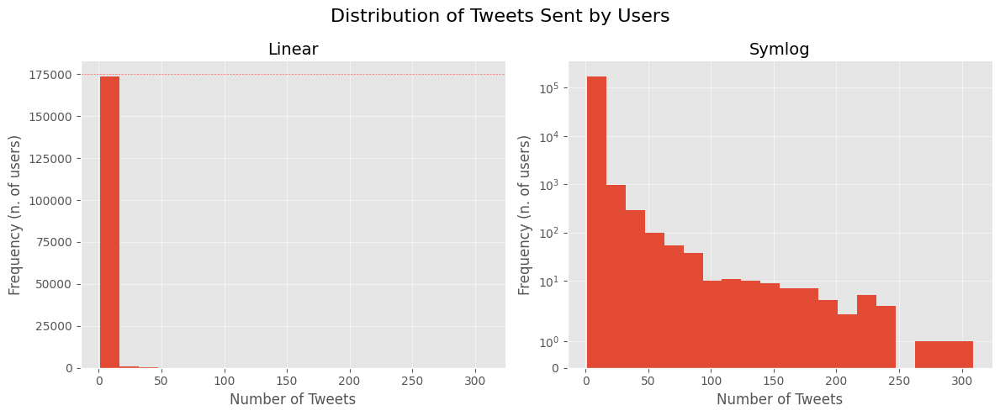

In [9]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

fig.suptitle('Distribution of Tweets Sent by Users', fontsize=16)
tot = temp.count().iloc[0]
# Plot 1
axes[0].hist(temp['count'], bins=20)
axes[0].spines[['top', 'right']].set_visible(False)
axes[0].set_xlabel("Number of Tweets", fontsize=12)
axes[0].set_ylabel("Frequency (n. of users)", fontsize=12)
axes[0].set_title('Linear', fontsize=14)
axes[0].grid(True, alpha=0.5)

# Plot 2
axes[1].hist(temp['count'], bins=20)
axes[1].spines[['top', 'right']].set_visible(False)
axes[1].set_xlabel("Number of Tweets", fontsize=12)
axes[1].set_ylabel("Frequency (n. of users)", fontsize=12)
axes[1].set_yscale('symlog', linthresh=2)
axes[1].set_title('Symlog', fontsize=14)
axes[1].grid(True, alpha=0.5)

axes[0].axhline(y=tot, color='red', linestyle='--', linewidth=0.5, alpha=0.6)
#axes[1].axhline(y=tot, color='red', linestyle='--', linewidth=0.5, alpha=0.6)
plt.tight_layout()
plt.savefig("tw sent", format="png")
plt.show()

##3.2. For each user how many tweets are a reply to them?




### 3.2.1. Creating replies value counts dataframe.

In [10]:
temp2= pd.DataFrame(data_all['reply_to_user'].value_counts())
print(temp2.describe())
temp2[0:21]

              count
count  76247.000000
mean       4.694008
std       49.699666
min        1.000000
25%        1.000000
50%        1.000000
75%        2.000000
max     5902.000000


,count
reply_to_user,
GOP,5902
JoeBiden,4967
harryjsisson,4096
KamalaHQ,3547
harris_wins,2420
GuntherEagleman,2327
POTUS,1970
ProudElephantUS,1902
simonateba,1715


### 3.2.2. Plotting the frequencies distribution.

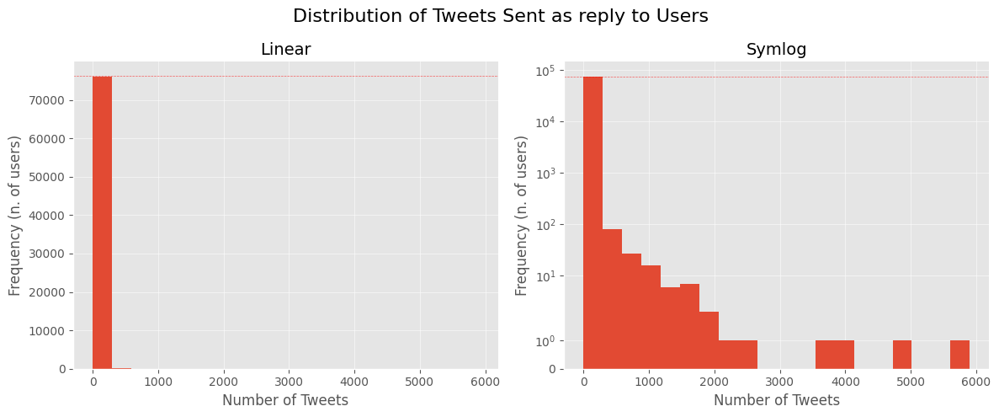

In [11]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
fig.suptitle('Distribution of Tweets Sent as reply to Users', fontsize=16)
tot = temp2.count().iloc[0]
# Plot 1
axes[0].hist(temp2['count'], bins=20)
axes[0].spines[['top', 'right']].set_visible(False)
axes[0].set_xlabel("Number of Tweets", fontsize=12)
axes[0].set_ylabel("Frequency (n. of users)", fontsize=12)
axes[0].set_title('Linear', fontsize=14)
axes[0].grid(True, alpha=0.5)

# Plot 2
axes[1].hist(temp2['count'], bins=20)
axes[1].spines[['top', 'right']].set_visible(False)
axes[1].set_xlabel("Number of Tweets", fontsize=12)
axes[1].set_ylabel("Frequency (n. of users)", fontsize=12)
axes[1].set_yscale('symlog', linthresh=2)
axes[1].set_title('Symlog', fontsize=14)
axes[1].grid(True, alpha=0.5)


axes[0].axhline(y=tot, color='red', linestyle='--', linewidth=0.5, alpha=0.6)
axes[1].axhline(y=tot, color='red', linestyle='--', linewidth=0.5, alpha=0.6)
plt.tight_layout()
plt.savefig("tw replies.png", format="png")
plt.show()


## 3.3. How is the tweets length attribute distributed?


### 3.3.1. Tweet-lengths series creation.

In [12]:
text_lengths = pd.Series([len(x) for x in data_all['text']])
text_lengths.describe()

,0
count,357904.000000
mean,142.782252
std,95.764740
min,1.000000
25%,65.000000
50%,119.000000
75%,213.000000
max,985.000000


###3.3.2. Plotting the distribution.

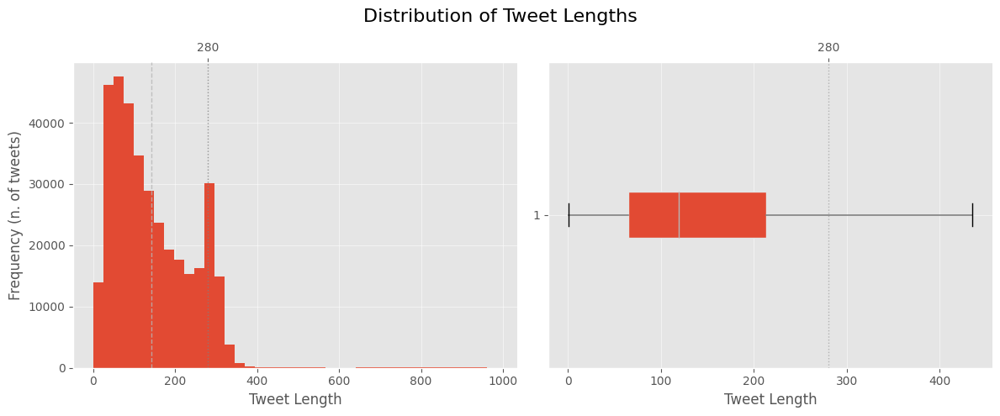

In [13]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
fig.suptitle('Distribution of Tweet Lengths', fontsize=16)
# Plot 1
axes[0].hist(text_lengths, bins=40)
axes[0].spines[['top', 'right']].set_visible(False)
axes[0].set_xlabel("Tweet Length", fontsize=12)
axes[0].set_ylabel("Frequency (n. of tweets)", fontsize=12)
axes[0].axvline(x=text_lengths.mean() , color='#b7b7b7', linestyle='--', linewidth=1, alpha=0.8) #median line
axes[0].axvline(x=280, color='grey', linestyle='dotted', linewidth=1, alpha=0.8)
axes[0].secondary_xaxis('top').set_xticks([280])
axes[0].grid(True, alpha=0.5)
# Plot 2
bp = axes[1].boxplot(text_lengths, vert=False, patch_artist=True, showfliers=False,
                boxprops=dict(facecolor='#E24A33', color='#E5E5E5'),
                medianprops=dict(color='#b7b7b7'))
for whisker in bp['whiskers']:
    whisker.set(color='#808080', linewidth=1.2)
axes[1].spines[['top', 'right']].set_visible(False)
axes[1].set_xlabel("Tweet Length", fontsize=12)
axes[1].axvline(x=280, color='grey', linestyle='dotted', linewidth=1, alpha=0.5)
axes[1].secondary_xaxis('top').set_xticks([280])
axes[1].grid(True, alpha=0.5)
plt.savefig("tw lengths.png", format="png")
#line = premium user length
plt.tight_layout()
plt.show()

##3.4 Analyzing the location attribute:
is the data a good sample (a representative sample) of the state of origin? \
That is, if 1 out of 100 Americans comes from state X, is the proportion of users from that state X in the tweet dataset also (near) 1/100 (for all states)?


###3.4.1. Reading the state codes and populations data.



> State codes:
https://www23.statcan.gc.ca/imdb/p3VD.pl?Function=getVD&TVD=53971


> Population data: https://en.wikipedia.org/wiki/List_of_U.S._states_and_territories_by_GDP

We will analyze District of Columbia as a state so U.S. have 51 states :)


In [14]:
states = pd.read_csv("drive/MyDrive/elections/usa_codes_pop.csv", sep = ';', thousands=',')
states.reset_index(inplace=True)
states = states.set_index('code')
states.head()

,index,state,population
code,,,
AL,0,Alabama,5108468
AK,1,Alaska,733406
AZ,2,Arizona,7431344
AR,3,Arkansas,3067732
CA,4,California,38965193


###3.4.2. Dataset creation for location frequency of users.

In [15]:
unique_users_df = data_all.drop_duplicates(subset=['username'], keep='first')
temp = unique_users_df.loc[:,'location']
print("Total number of users: " + str(len(temp)))
locations = temp[(temp != '') & (temp.str.lower() != 'earth')]
locations = locations.dropna()
print("Users with valid location:" + str(locations.notna().sum())) # how many twitter users have location data (about 1/2 of total)
loc_freq = pd.DataFrame(locations.value_counts())
loc_freq

Total number of users: 175279
Users with valid location:78987


,count
location,
United States,3326
USA,1620
"Florida, USA",1117
"Texas, USA",866
"California, USA",846
...,...
"Baywood, NY",1
Baseball legend,1
"Rochdale,",1


### 3.4.3. Function to process the noisy location attribute.
It is noisy because everyone can set theirs profile location with any string: even jokes. For instance as you can see many users have Earths or emojis as
`location`. \
If there is a name of a state inside the ```location```
 attribute the function will substitute it with the official **state** code, othwerwise it will be dropped for this analysis.

In [16]:
def get_state_code(place : str) -> str :
    for st_id in states.index:
        if st_id == 'VA': #to keep West Virginia values from being merged into Virginia
            continue
        if states.loc[st_id,'state'].lower() in place.lower():
            return st_id

    if 'virginia' in place.lower():
        return 'VA'
    return ''
print(get_state_code("Virginia, USA"))
print(get_state_code("West Virginia, USA"))

VA
WV


###3.4.4. Applying the processing function and merging the tweet users `location` proportion with state data.

In [17]:
loc_freq['state_code'] = loc_freq.index.map(get_state_code)
loc_freq = loc_freq[loc_freq['state_code'] != '']

loc_freq_group = loc_freq.groupby('state_code')['count'].sum().reset_index()

loc_freq_group = loc_freq_group.set_index('state_code')
loc_freq_group.index = loc_freq_group.index.astype(str)
loc_freq_group = pd.merge(loc_freq_group, states, left_index=True, right_on='code', how='inner')
# loc_freq_group['log_count'] = np.log1p(loc_freq_group['count'])
loc_freq_group['log_count_prop'] = np.log1p(loc_freq_group['count']) / np.log1p(loc_freq_group['count']).sum() # logarithmic proportion: log(x) / sum_i(log(i))
sample_size = loc_freq_group['count'].sum()
print("Num of users in the sample: " + str(sample_size))
loc_freq_group.head()

Num of users in the sample: 19267


,count,index,state,population,log_count_prop
code,,,,,
AK,72,1,Alaska,733406,0.015587
AL,193,0,Alabama,5108468,0.019138
AR,156,3,Arkansas,3067732,0.018370
AZ,595,2,Arizona,7431344,0.023216
CA,1693,4,California,38965193,0.027011


###3.4.5. Plotting the proportion of users in each state with an interactive Choropleth map.

Taking the logarithms of the user counts because I wanted the color to be more sensitive in changes at lower values. But it can be more easily done with a more appopriate color-scale or with a tranformation of it (also a much less
computationally expensive option)

In [18]:
map = px.choropleth(
    loc_freq_group.reset_index(),
    locations = 'code',
    locationmode = 'USA-states',
    scope = 'usa',
    color = 'log_count_prop',
    hover_name = 'state',
    hover_data={'log_count_prop': False, 'count': ':,d'},
    color_continuous_scale = 'peach', #'ylorbr','peach', 'oranges','brwnyl'
    title='Twitter users (in the dataset) by State',
)
tick_values = [100, 1000, 5000]

formatted_ticks = [f"{val:,.0f}" for val in tick_values]

log_tick_values = np.log1p(tick_values)
#max_count = loc_freq_group['count'].max()
map.update_coloraxes(
    colorbar_title='User Count',
    #colorbar_tickvals=np.log1p(tick_values),
    colorbar_tickvals = np.log1p(tick_values) / np.log1p(loc_freq_group['count']).sum(),
    colorbar_ticktext=formatted_ticks,
)

map.update_layout(
    coloraxis_colorbar=dict(
        x = 0.5,
        y = -0.2,
        orientation="h",
        title="Count",
    )
)

map.show()


###3.4.6. Plotting the proportion of the REAL population in each state with an interactive Choropleth map.







In [19]:
states['log_pop_prop'] = np.log1p(states['population']) / np.log1p(loc_freq_group['population']).sum()

#min_pop = states['population'].min()
#max_pop = states['population'].max()
lt = 1000000
tick_values = [lt,3*lt,10*lt, 30*lt]
formatted_ticks = [f"{val:,.0f}" for val in tick_values]

log_tick_values = np.log1p(tick_values)

map = px.choropleth(
    states.reset_index(),
    locations='code',
    locationmode='USA-states',
    scope='usa',
    color='log_pop_prop',
    hover_name='state',
    hover_data={'log_pop_prop': False, 'population': ':,d'},
    color_continuous_scale='peach',
    title='Population by State',
)

map.update_coloraxes(
    colorbar_title='Population',
    colorbar_tickvals = np.log1p(tick_values) / np.log1p(loc_freq_group['population']).sum(),
    #colorbar_tickvals=log_tick_values,
    colorbar_ticktext=formatted_ticks,
)

map.update_layout(
    coloraxis_colorbar=dict(
        x = 0.5,
        y = -0.2,
        orientation="h",
        title="Population",
    )
)

map.show()


###3.4.7. Plotting the increase/decrease between the percentage of tweeters by state and the percentage represented by the state in the total US population.
For example Florida is 6.7% of total US population but has 12.3% of twitter users in the dataset. 5.6 more but relative to 6.7% it's an 81% increase.
Washington

In [20]:
#percentages with respect to the total distribution of tweets
loc_freq_group['percentage_users'] = 100 * loc_freq_group['count'] / loc_freq_group['count'].sum()
#percentages with respect to the total distribution of population
loc_freq_group['percentage_population'] = 100 * loc_freq_group['population'] / loc_freq_group['population'].sum()

# formula for how much increased the % in tweets with respect to population %:
# x is such that : population_percent * (1 +x/100) = tweet_percent
# so --> x = ( tweet percent/pop_percent - 1) * 100
loc_freq_group['%twit_user_vs_%population'] = 100 * (loc_freq_group['percentage_users'] / loc_freq_group['percentage_population'] - 1)
color_scale = px.colors.diverging.RdBu[::-1]

# Create the choropleth map
map = px.choropleth(
    loc_freq_group.reset_index(),
    locations='code',
    locationmode='USA-states',
    scope='usa',
    color='%twit_user_vs_%population',  # Use the ratio of percentages
    hover_name='state',
    hover_data={
        '%twit_user_vs_%population': ':.2f',
        'percentage_users': ':.4f',
        'percentage_population': ':.4f',
        'population': False,
        'count': False,
    },
    color_continuous_scale=color_scale,
    title='Ratio Between TwitterUsers% and Population% by State',
)

map.update_coloraxes(
    colorbar_title='Difference (% Ratio)',
    colorbar_tickformat='.2f',
    cmid=0
)

map.update_layout(
    coloraxis_colorbar=dict(
        x=0.5,
        y=-0.2,
        orientation="h",
        title="Difference (% Ratio)",
    )
)

map.show()



###3.4.8. Testing statistically the representativity of the sample: Goodness of Fit χ²-*test*.



#### GOF Hypothesis Test.

#### Explanation of the Symbols:
- **k** : Number of categories (states) in the population.
- **n** : Total number of observations in the sample.
- **oᵢ** : Observed tweeters count for the i-th state.
-p<sub>i</sub> : Proportion of the real population in the i-th state
- **eᵢ** : Expected frequency for the i-th state (calculated as **n** × p<sub>i</sub>`).
- **α** : Significance level of the test.

#### Test Hypotheses:

### **Null Hypothesis (H₀):**
  ### - *p<sub>i</sub> = p<sub>i</sub><sup>0</sup>, for i = 1, 2, ..., k*

### **Alternative Hypothesis (H<sub>A</sub>):**

  ### - *p<sub>i</sub> ≠ p<sub>i</sub><sup>0</sup>, for at least one i = 1, 2, ..., k*


#### Test Statistic:
The test statistic is calculated using the chi-squared formula:

### <center>χ² = Σ<sup>k</sup><sub>i=1</sub> (o<sub>i</sub> - e<sub>i</sub>)² \ e<sub>i</sub></center><br>


#### Decision Rule:

We reject the null hypothesis (H₀) and accept the alternative hypothesis (H<sub>A</sub>) if the calculated chi-squared statistic (χ²) is greater than the critical chi-squared value at the given significance level (α) and degrees of freedom (k-1):

###<center>χ² > χ²<sub>α(k-1)</sub></center><br>


In [21]:
#from scipy.stats import chisquare, chi2

population_proportions = states['population'] / states['population'].sum()
expected = population_proportions * sample_size

#Chi squared test
chi2_stat, p_value = chisquare(f_obs=loc_freq_group['count'], f_exp=expected)

#Results
print(f"Chi-squared statistic: {chi2_stat}")
print(f"P-value: {p_value}")

alpha = 0.05  #Standard significance level
if p_value < alpha:
    print("The sample is not representative of the real population (reject H0).")
else:
    print("The sample is representative of the real population (cannot reject H0).")

Chi-squared statistic: 53496.961569808795
P-value: 0.0
The sample is not representative of the real population (reject H0).


In [22]:
#checking manually if test statistic is correct. It looks too high to me.
print(((loc_freq_group['count'] - expected)**2 / expected).sum())
print(chi2.ppf(1-alpha, df=len(loc_freq_group)-1)) # critical value (50 degrees of freedom)
# Lower than scipy but still higher than critical value. So we can reject the null hypothesis.

2210.8399776133983
67.5048065495412


So now we know that the twitter dataset doesn't have a distribution equal to the USA population and we also know that every analysis in which we will use the location attribute cannot be generalized to the general population.

#4. Construction of the social graph:

##4.1. Data filtering.
I want to create a social graph from the tweets and to perform sentiment analysis on it. Since the dataset doesn't include following/follower relations between users, I used the tweet data of the tweeter and of the person it was a reply to, to create a social graph, using edges between users. So the dataframe fields that I used are `username` and `reply_to_user`.
But first i will filter to dataset and perform sentiment analysis.


###4.1.1. Preparing the tweets data to visualize and calculating the counts of replies sent and recieved.

Because I want the graph not to be so sparse. So unconnected (or connected but not in this sample) twitter users will be dropped, because they all would just add noise in the visualization, and no useful infor

In [23]:
users_tweets = data_all[(data_all['username'] != data_all['reply_to_user'])] # I don't want to include self replies

tweets_sent =users_tweets["username"].value_counts().reset_index()
tweets_sent.columns = ["person", "tweets_sent"]

# Calculate the number of times people replied to each person (receivers)
replies_received = users_tweets["reply_to_user"].value_counts().reset_index()
replies_received.columns = ["person", "replies_received"]

# Merge the two tables to create the final df
summary = pd.merge(tweets_sent, replies_received, on="person", how="left")
summary["replies_received"] = summary["replies_received"].fillna(0).astype(int)

# Sort by tweets sent in descending order
summary = summary.sort_values(by="tweets_sent", ascending=False)

summary


,person,tweets_sent,replies_received
0,BenStanton77,308,59
1,conservativebox,287,5
2,petermanbill196,267,2
3,JoeBiden268198,246,1
4,superdegeen,243,0
...,...,...,...
91699,baerhealth,1,0
91698,Rlr114,1,0
91697,brad74_d,1,0
91696,makingsense136,1,0


### 4.1.2. Filtering the tweeters to not include less connected users.  
(You can adjust this tresholds to the dataset size or to your needs)


In [24]:
filtered_summary = summary[(summary['tweets_sent'] > 4) & (summary['replies_received'] > 2)]
filtered_summary

,person,tweets_sent,replies_received
0,BenStanton77,308,59
1,conservativebox,287,5
5,IcanAmer_MAGA,235,79
7,DabbKen,225,5
8,MAGAWoodworker,223,3
...,...,...,...
9239,mmmautone,5,3
9240,WordpeckerUSA,5,14
9247,Vets4AP,5,3
9251,DogginTrump,5,14


In [25]:
valid_users = filtered_summary["person"].tolist()  # List of connected users from summary
filtered_data = data_all[data_all["username"].isin(valid_users) & data_all["reply_to_user"].isin(valid_users)].copy()
filtered_data.reset_index(drop=True, inplace=True)

# 5. VADER Sentiment Analysis


> https://github.com/cjhutto/vaderSentiment

It's a sentiment analysis tool based on lexicon scores, and ideal for short text, in which the context is normally implicit and language model learners can struggle.

####**Input:** Raw text (can keep emojis because most are inside the lexicon).

####**Sentiment Components:**

VADER identifies three sentiment components at the token level:

- **Positive (pos)**
- **Neutral (neu)**
- **Negative (neg)**


###<center> S = {pos, neu, neg}</center><br>
where 0 ≤ pos, neu, neg ≤ 1

So these scores are how much 'words'(tokens) of the total have one sentiment weighted by a score taken from a score lexicon generated from an experiment with human evaluators.
These components are quantified as proportions within a sentiment set:

####**Compound Score:**

An overall sentiment score, ranging from -1 (highly negative) to +1 (highly positive):

###<center>-1 ≤ compound ≤ 1</center><br>
To assign a label from coumpond score it's usual to partition in three parts the compound score range [ -1,1 ].

##5.1. Preparing the text data to be analyzed.
Will start to analyze the tweets from which we constructed the graph.

### 5.1.1. Defining the next preprocessing function.


In [26]:
'''
# Load spaCy and stemmer
nlp_spacy = spacy.load('en_core_web_sm')
stemmer = Stemmer.Stemmer('english')
'''
'''
#don't need to remove emojis with Vader
emoji_pattern = re.compile(
        "["
        u"\U0001F600-\U0001F64F"  # Emoticons
        u"\U0001F300-\U0001F5FF"  # Symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # Transport & map symbols
        u"\U0001F700-\U0001F77F"  # Alchemical symbols
        u"\U0001F780-\U0001F7FF"  # Geometric shapes extended
        u"\U0001F800-\U0001F8FF"  # Supplemental arrows-C
        u"\U0001F900-\U0001F9FF"  # Supplemental symbols and pictographs
        u"\U0001FA00-\U0001FA6F"  # Chess symbols
        u"\U0001FA70-\U0001FAFF"  # Symbols and pictographs extended-A
        u"\U00002702-\U000027B0"  # Dingbats
        u"\U000024C2-\U0001F251"  # Enclosed characters
        "]+",
        flags=re.UNICODE,
    )
'''

#Preprocess text (tokenization, stemming, cleaning)
def preprocess_text(data):
    '''
    #with vader don't need anymore stemming (or neither lemmatization) it's all automatic
    doc = nlp_spacy(data)
    tokens = []
    for token in doc:
        if not token.is_stop and not token.is_punct:
            lemma = token.lemma_.lower()
            stemmed_token = stemmer.stemWord(lemma)
            tokens.append(stemmed_token)
    # Add tokens back inside text
    data = ' '.join(tokens)
    '''

    # Remove hashtags, mentions, and URLs
    data = re.sub(r"@\S*\s?", "", data)
    data = re.sub(r'(http|https)?://\S+|www\.\S+', '', data)
    #data = emoji_pattern.sub(r'', data)
    # Remove special characters, numbers, and extra spaces
    data = re.sub(r'[^\w\s]+', '', data)
    data = re.sub(r'[\d]+', '', data)
    data = ' '.join(word for word in data.split() if len(word) > 1)

    return data.strip()

### 5.1.2. Applying preprocessing.

In [27]:
filtered_data['processed_text'] = filtered_data['text'].apply(preprocess_text)

### 5.1.3. Checking preprocessing results on a few tweets.
Comparing original text with processed one.

In [28]:
for tweet in filtered_data["text"][12:22]:
    print(tweet)

@SaltyTanker2 @kingodirt22055 @mr_maintenanc3 @WhiteRonin22 @9teen80four @airdata8 @AngryFleas @jbizzy6969 @Billenjoylife @2_drac @Blitz0076 @Maxamegalon2000 @Eodyne1 @estockbridge @OblivionVortex @schwatd2 @sharky_politics @MucusMucous1 @spagpus64755 @astragal @dulcieburt @ShellyRKirchoff @glennl537158 @TreatHunterDog @dirk_fasshauer @BconnectedJ @jimaw63 @DonnaHartline22 @Robheat38 @MooseyDogIV @lostandlovinit @StonKold @caesarstruth @avatarmax123 @MtkaMoose @PatrioticKitten @LynnAppleby14 @8BrianVogel4 @dogsdontliket @hrt6017 @FROGfish0 @Its_Just_Ric @EarlDBarnes2 @RobertRiver67 @HamRadioJoe @JAlan21813286 @AccofLafler @tRick_the_only @politicaloof No. Use some common sense. 

If that was true, Comer would have made a DOJ referral. 

Hunter would be indicted for more than the gun charge &amp; tax fraud. 

House GOP would be in favor of impeachment. 

You KNOW it’s the Trump Crime family &amp; you’re trying to distract.
@MAGAShaggy1 #MAGA
@xcitizenjournal @EdKrassen Imagine if Biden'

In [29]:
for tweet in filtered_data["processed_text"][12:22]:
    print(tweet)

No Use some common sense If that was true Comer would have made DOJ referral Hunter would be indicted for more than the gun charge amp tax fraud House GOP would be in favor of impeachment You KNOW its the Trump Crime family amp youre trying to distract
MAGA
Imagine if Bidens ex wife fell down the stairs and then was buried at one of his golf courses
It sure does pay to have the last name Biden
Biden
The MAGA crowd isnt big on critical thinking
You speak for no one but yourself
We wouldnt have million illegals and cells that are threat to All Americans if Paul Ryan turned over powers of the purse to Trump for the border wall But no he and Mitch wanted the tax cuts first and told Trump they would fund it afterwards They lied and backstabbed
It was unnecessary as Dr Biden raised Hunter That is his mother Katie is Trumper and proves her disdain for Dems and the Bidens over and over
Judges ruling on cases in which they have clear affinity for one of the parties Like when theyre judging the 

##5.2. Applying sentiment analysis.

###5.2.1. Defining function to label from compound score.

In [30]:
def assign_labels(compound):
    if compound >= 0.05:
        return 'Positive'
    elif compound <= -0.05:
        return 'Negative'
    else:
        return 'Neutral'

###5.2.2. Applying the Vader Sentiment Analyzer.




In [31]:
analyzer = SentimentIntensityAnalyzer()
vs = analyzer.polarity_scores
filtered_data['sentiTemp'] = filtered_data['processed_text'].apply(vs)
filtered_data['sentiment_score'] = filtered_data['sentiTemp'].apply(lambda x: x['compound'])
filtered_data['label'] = filtered_data['sentiment_score'].apply(assign_labels)
filtered_data.loc[0:10,['processed_text','sentiment_score', 'label']]


,processed_text,sentiment_score,label
0,President Joe Biden will remain as president G...,0.6841,Positive
1,Right Im being ridiculous MAGAS would never ch...,-0.9470,Negative
2,Yup liberals dont want to believe the truth Do...,0.4895,Positive
3,In your chart by using the index we can see th...,0.0000,Neutral
4,Just so you guys know among lawyers just about...,0.5267,Positive
5,was only talking about the hostage situation f...,0.0000,Neutral
6,Oh Brian Id say all kinds of things to you in ...,-0.1280,Negative
7,Interesting But heres the glitch Hunter Biden ...,-0.5574,Negative
8,dont think we can call Gender Bender Studies a...,0.7579,Positive
9,No one thinks Biden has sexually assaulted any...,-0.8834,Negative


### 5.3. Analysis of the results.

###5.3.1. Checking the resulting labels proportions.

In [32]:
sentmnt = filtered_data.loc[:,['label']].value_counts()
sentmnt

,count
label,
Negative,1737
Positive,1533
Neutral,1210


###5.3.2. Visualizing the sentiments proportions: Donut Plot.

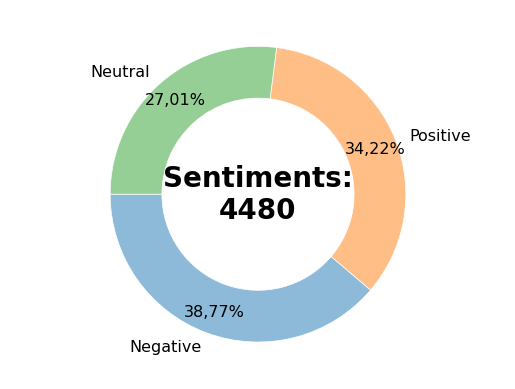

In [33]:
def make_pie(sizes, text, labels, palette, alpha):
    fig, ax = plt.subplots()
    ax.axis('equal')

    colors_with_alpha = [(*color, alpha) for color in palette]

    def my_autopct(pct):
        return '{:.2f}%'.format(pct).replace('.', ',')

    kwargs = dict(colors=colors_with_alpha, startangle=180, autopct=my_autopct,  textprops={'color': 'black', 'fontsize': 11.5})
    outside, _, _ = ax.pie(sizes, radius=1, pctdistance=0.85,
                           labels=labels, **kwargs)

    width = 0.35
    plt.setp(outside, width=width, edgecolor='white')

    kwargs = dict(size=20, fontweight='bold', va='center')
    ax.text(0, 0, text, ha='center', **kwargs)
    plt.savefig("Pie.png", format ='png')
    plt.show()

sizes = sentmnt.values
labels = sentmnt.index.get_level_values('label').unique().tolist()
text = "Sentiments:\n{}".format(len(filtered_data))
palette = sns.color_palette("tab10", len(labels))
alpha = 0.5
make_pie(sizes, text, labels, palette, alpha)

###5.3.3 Creating the di-graph with users replies to visualize users interactions.


In [34]:

# Aggregate sentiment by username and collect tweets
user_sentiment = (
    filtered_data.groupby('username')
    .agg(
        average_sentiment_score=('sentiment_score', 'mean'),
        tweets=('processed_text', list)
    )
    .reset_index()
)

# Assign sentiment label to average score
user_sentiment['average_label'] = user_sentiment['average_sentiment_score'].apply(assign_labels)

# Filter valid users based on previous filtering logic
valid_users = user_sentiment["username"].tolist()
filtered_data = filtered_data[filtered_data["username"].isin(valid_users) & filtered_data["reply_to_user"].isin(valid_users)].copy()
filtered_data.reset_index(drop=True, inplace=True)

G = nx.DiGraph()

# Add edges to the graph
for _, row in filtered_data.iterrows():
    sender = row["username"]
    receiver = row["reply_to_user"]
    if pd.notna(receiver):  # Ensure receiver is not NaN
        G.add_edge(sender, receiver)

# Remove self-loops and isolated nodes
G.remove_edges_from(nx.selfloop_edges(G))
G.remove_nodes_from(list(nx.isolates(G)))

# Define a threshold for minimum component size
min_component_size = 3

# Identify and remove small components
components = list(nx.strongly_connected_components(G))
small_components = [c for c in components if len(c) < min_component_size]
for subgraph in small_components:
    G.remove_nodes_from(subgraph)

# Assign cluster IDs (integers) to nodes
components = list(nx.strongly_connected_components(G))
#cluster_mapping = {node: idx for idx, cluster in enumerate(clusters) for node in cluster}


# Add cluster ID and sentiment data as node attributes
for node in G.nodes:
    #G.nodes[node]['cluster_id'] = cluster_mapping[node]
    user_data = user_sentiment[user_sentiment['username'] == node]
    if not user_data.empty:
        G.nodes[node]['average_sentiment_score'] = user_data.iloc[0]['average_sentiment_score']
        G.nodes[node]['sentimentLabel'] = user_data.iloc[0]['average_label']
        # Convert tweets to a string to avoid the unpacking error
        G.nodes[node]['tweets'] = '---\n'.join(user_data.iloc[0]['tweets'])  # Join tweets into a single string

# Print graph information
print(f"Number of nodes: {G.number_of_nodes()}")
print(f"Number of edges: {G.number_of_edges()}")


Number of nodes: 284
Number of edges: 498


#### Saving the graph as a .gexf file to visualize it with gephi.


> https://gephi.org/gephi-lite/



In [35]:
nx.write_gexf(G, "user_sentiment_graph.gexf")

###5.3.4. Wordcloud generation for all text and each sentiment.
Generating wordclouds to show in a cool way an approximate and qualitative view of the distribution of words, for each sentiment.

In [40]:
#import spacy
#from wordcloud import WordCloud, STOPWORDS
#from PIL import Image
#from matplotlib.colors import LinearSegmentedColormap

text = " ".join(item for item in filtered_data["processed_text"])

temp_POS = filtered_data[filtered_data["label"] == "Positive"]["processed_text"]
text_POS = " ".join(item for item in temp_POS)
temp_NEG = filtered_data[filtered_data["label"] == "Negative"]["processed_text"]
text_NEG = " ".join(item for item in temp_POS)
temp_NEU = filtered_data[filtered_data["label"] == "Neutral"]["processed_text"]
text_NEU = " ".join(item for item in temp_POS)

nlp = spacy.load("en_core_web_sm")
mask = np.array(Image.open('page_mask.jpg'))
colors = ["#BF0A30", "#002868"]
cmap = LinearSegmentedColormap.from_list("mycmap", colors)
MAX_WORDS = 1000 # for this image example should be above 1000 for the image not to be sparse
MAX_FONT = 400
def generate_wordcloud(data, color_map, label: str):
    wordcloud = WordCloud(background_color="white",
                          font_path = 'Ignazio.ttf', #'Assets/Font/Ignazio.ttf'
                          mask=mask,
                          stopwords=STOPWORDS.union(nlp.Defaults.stop_words),
                          max_words=MAX_WORDS,
                          max_font_size=MAX_FONT,
                          colormap=color_map,
                          collocations=False,
                          width=mask.shape[1],
                          height=mask.shape[0])

    wordcloud.generate(data)

    plt.figure(figsize=(20,20))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.margins(x=0, y=0)
    plt.savefig("cloud-"+label+'.png', format="png")
    plt.show()

cmap_pos = LinearSegmentedColormap.from_list("mycmap_pos", ['#36BA98','#D8A058','#E08B5D','#E76F51'])
cmap_neu = LinearSegmentedColormap.from_list("mycmap_neu", ["#22223b","#4a4e69","#9a8c98","#c9ada7"]) #f2e9e4
cmap_neg = LinearSegmentedColormap.from_list("mycmap_neg", ["#8B1E3F","#3B4A6B","#2F2F40","#5A5A66"])


####Wordcloud from distribution of all tweets.

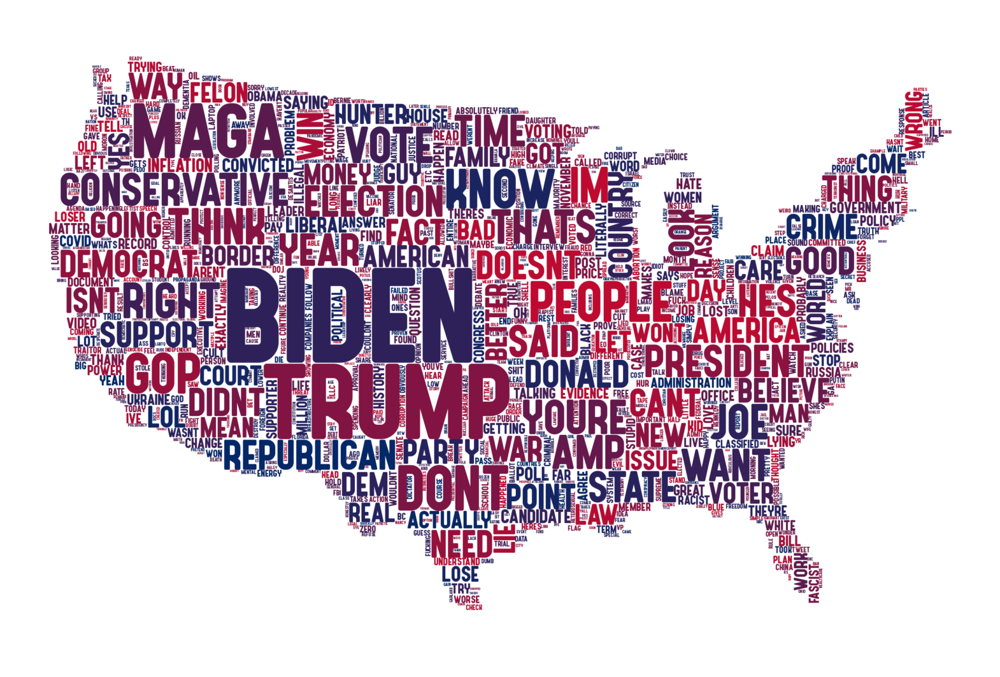

In [41]:
generate_wordcloud(text,cmap,'all')

####Wordcloud from positive tweets.

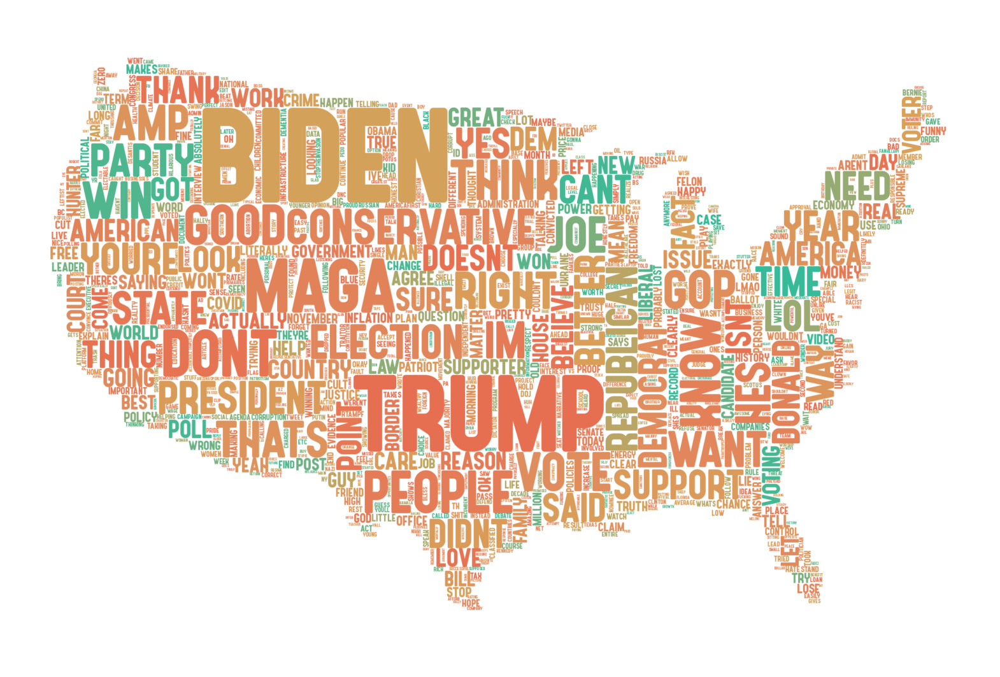

In [42]:
generate_wordcloud(text_POS,cmap_pos,'pos')

####Wordcloud from neutral tweets.

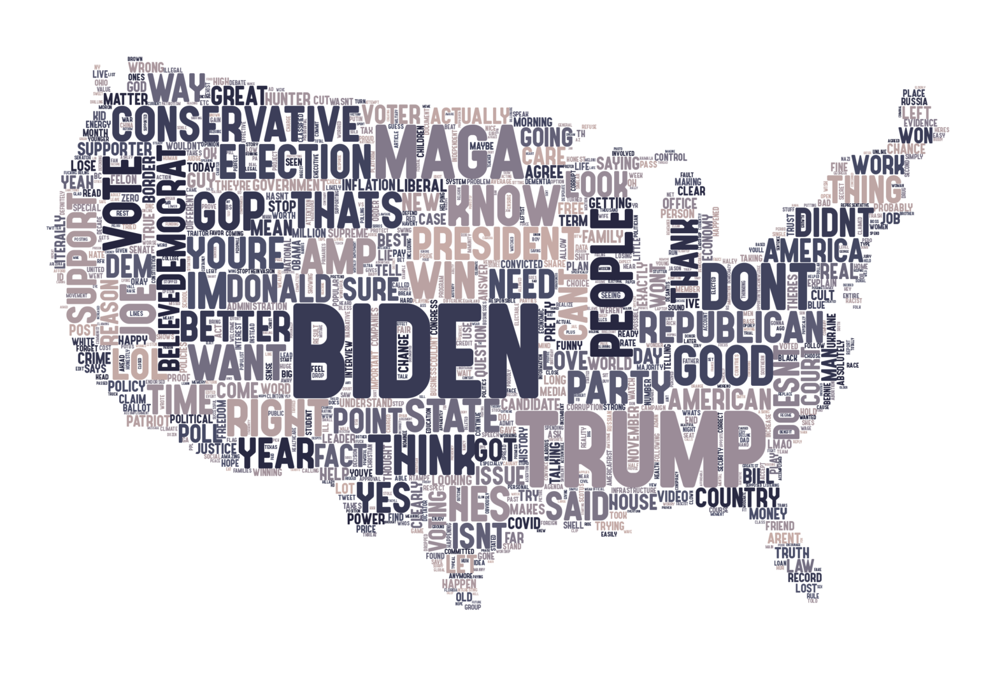

In [43]:
generate_wordcloud(text_NEU, cmap_neu,'neu')

####Wordcloud from negative tweets.

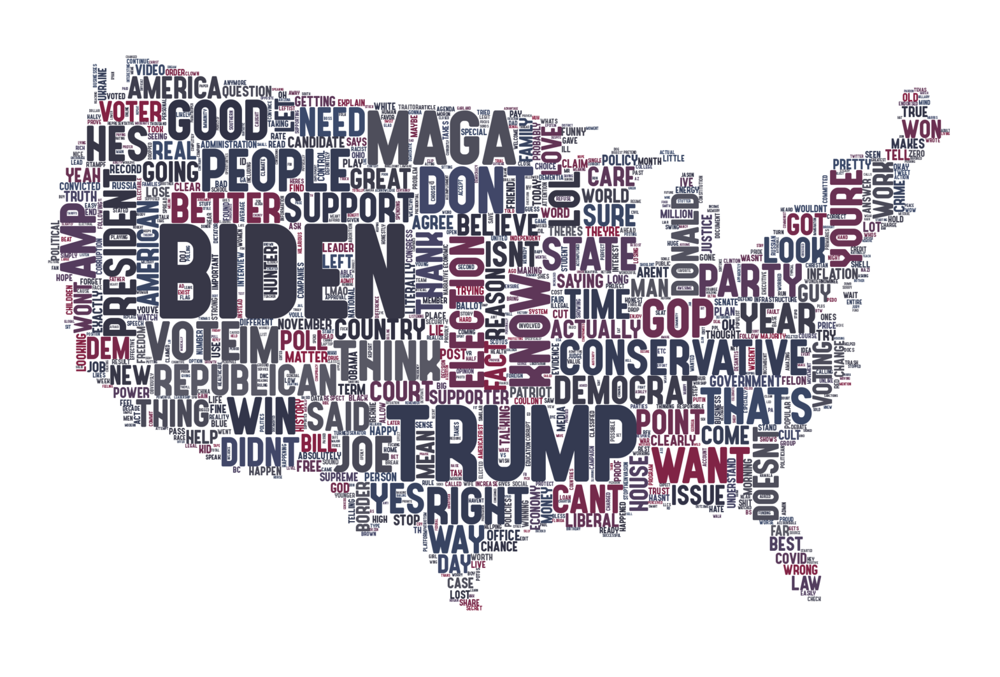

In [44]:
generate_wordcloud(text_NEG,cmap_neg,'neg')


###5.3.5. Wordcloud Bigram generation.
Bigrams are the couple of words and here I'm generating worclouds from the most frequent ones.

In [45]:
#from sklearn.feature_extraction.text import CountVectorizer
#from collections import Counter


def generate_bigram_wordcloud(data, color_map, label:str):
    # Calculating bigrams frequencies using CountVectorizer
    vectorizer = CountVectorizer(ngram_range=(2, 2), stop_words='english')
    bag_of_words = vectorizer.fit_transform([data])
    bigram_counts = Counter(dict(zip(vectorizer.get_feature_names_out(), bag_of_words.toarray().sum(axis=0))))

    wordcloud = WordCloud(
        background_color="white",
        font_path='Ignazio.ttf',
        stopwords=STOPWORDS.union(nlp.Defaults.stop_words),
        mask=mask,
        max_words=MAX_WORDS,
        max_font_size=MAX_FONT,
        colormap=color_map,
        width=mask.shape[1],
        height=mask.shape[0],
    ).generate_from_frequencies(bigram_counts)

    plt.figure(figsize=(20, 20))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.savefig(f"bigram_cloud_{label}.png", format="png")
    plt.show()

####All tweets bigram Wordcloud.

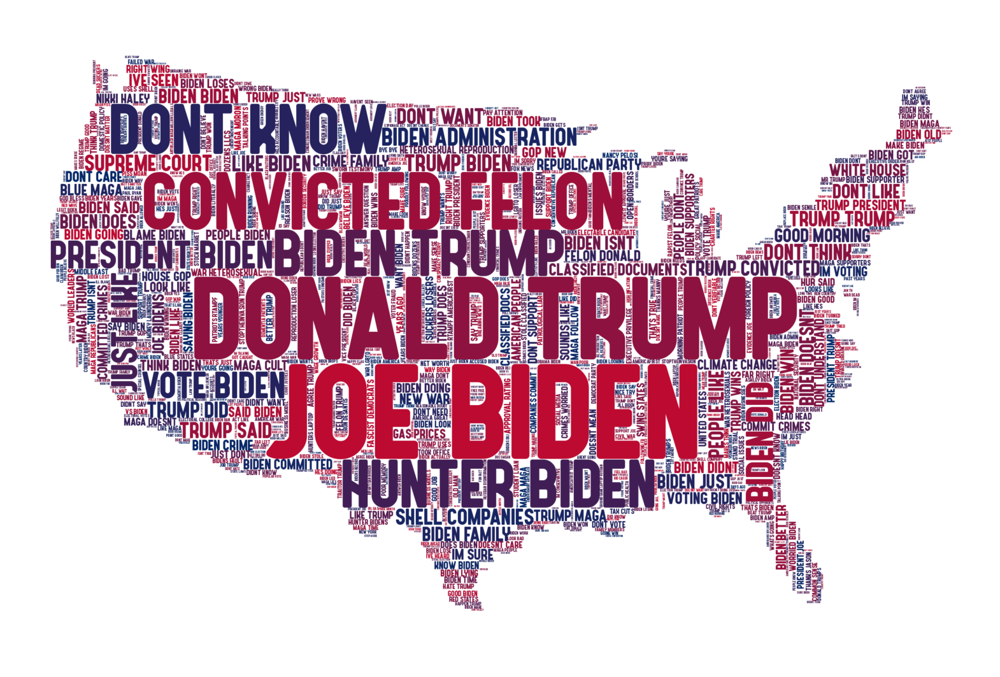

In [46]:
generate_bigram_wordcloud(text, cmap, 'all')

#### Positive tweets bigram Wordcloud.

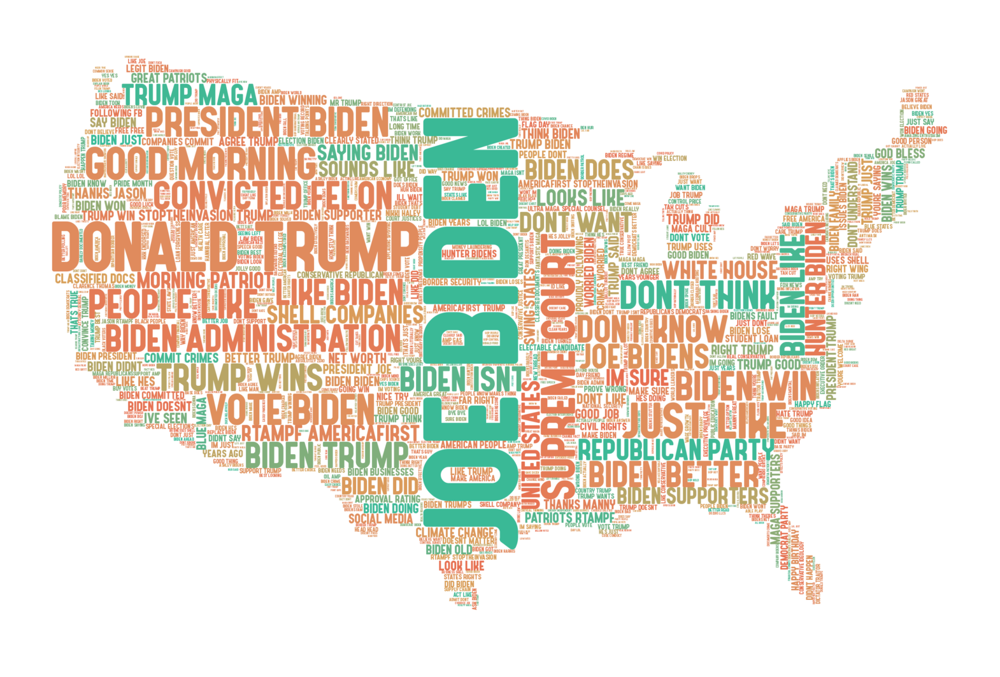

In [47]:
generate_bigram_wordcloud(text_POS, cmap_pos, 'pos')

#### Neutral tweets bigram Wordcloud.

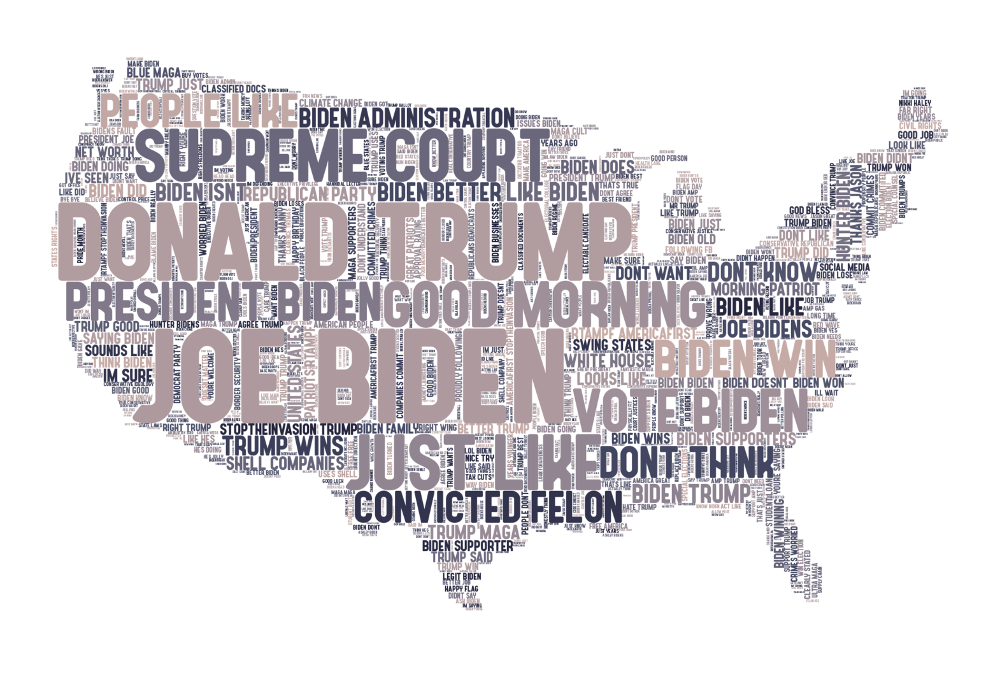

In [48]:
generate_bigram_wordcloud(text_NEU, cmap_neu, 'neu')

####Negative tweets bigram Wordcloud.

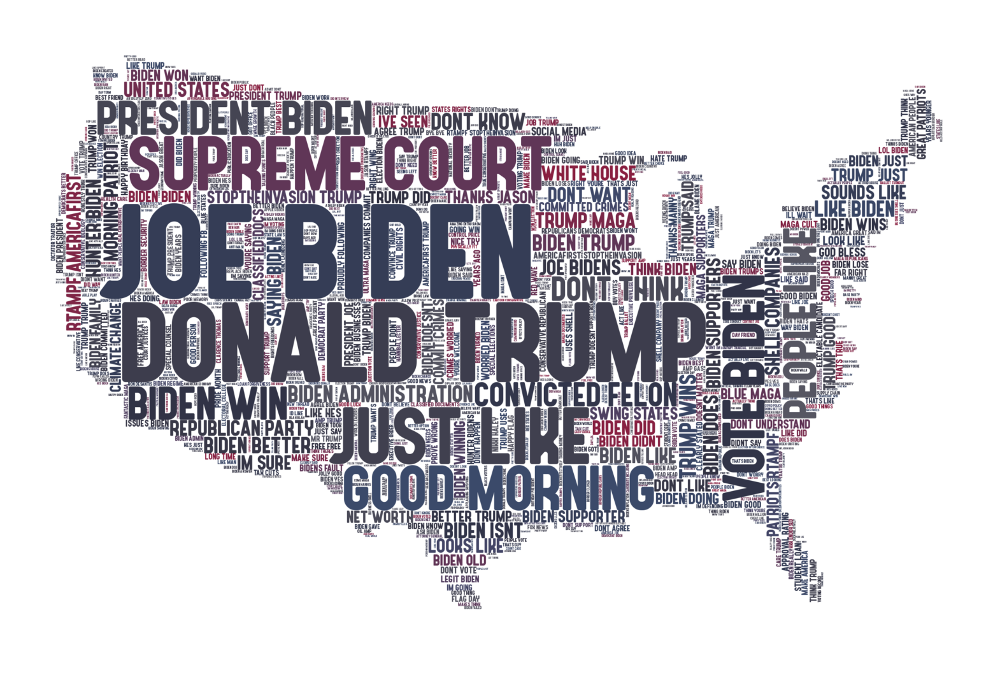

In [49]:
generate_bigram_wordcloud(text_NEG, cmap_neg, 'neg')

###5.3.6. Has sentiment an influence on tweet likes?

In [51]:
MIN_LIKES = 1   # Tresholds to adjust for better visualization
MAX_LIKES = 100 # ''
likes_all = filtered_data[(filtered_data['likeCount'] > MIN_LIKES) & (filtered_data['likeCount'] < MAX_LIKES)][['likeCount', 'label']]

fig2 = px.violin(
    likes_all,
    y="likeCount",
    x="label",
    color="label",
    color_discrete_sequence=["#f9973c","#95cf95","#8ebad9"],
    box=True,
    points="all",
    title="Likes by Sentiment",
    category_orders={'label':['Positive', 'Neutral', 'Negative']}
)
fig2.show()



###5.3.7. Visualizing frequents hashtags and their sentiment label.
Will start applying the analyzer on all tweets, because very few tweets have hashtags.

In [46]:
data_all['processed_text'] = data_all['text'].apply(preprocess_text)
data_all['sentiTemp'] = data_all['processed_text'].apply(vs)
data_all['sentiment_score'] = data_all['sentiTemp'].apply(lambda x: x['compound'])
data_all['label'] = data_all['sentiment_score'].apply(assign_labels)
data_all.drop(['sentiTemp','sentiment_score'], axis = 1,inplace=True)

#### Function to extract data from the hashtag column because it's a column with type of a list of strings representing a dictionary for each hashtag like so:

```
[{'indices': [29, 34], 'text': 'MAGA'}, {'indices': [125, 140], 'text': 'EnoughIsEnough'}, {'indices': [153, 176], 'text': 'VoteOutEveryRepublican'}]```




In [47]:
def extract_hashtags(hashtags_str):
    try:
        hashtags_list = ast.literal_eval(hashtags_str)
        return [hashtag['text'].lower() for hashtag in hashtags_list if isinstance(hashtag, dict) and 'text' in hashtag]
    except (SyntaxError, ValueError):
        return []

temp = data_all.loc[:,['label','hashtags']].copy()
temp['hashtags'] = temp['hashtags'].apply(extract_hashtags)
temp = temp.explode(['hashtags'])
temp.dropna(subset = 'hashtags', inplace=True)
temp.head()

,label,hashtags
12,Negative,iom
13,Neutral,trump2024
42,Positive,usa
42,Positive,usared
42,Positive,reddawn


####Hashtags bar-chart: creating dataframe for plot from hashtags value counts and plotting.

In [48]:
temp_counts = temp.value_counts().reset_index(name='count')
temp_counts.columns = ['label', 'hashtags', 'count']


pivot_df = temp_counts.pivot(index='hashtags', columns='label', values='count').fillna(0)

pivot_df['total_count'] = pivot_df.sum(axis=1)
top_10_hashtags = pivot_df.nlargest(10, 'total_count').drop(columns='total_count').iloc[::-1] #reverse the order for plotting. I want the largest up.

fig = px.bar(
    top_10_hashtags,
    y=top_10_hashtags.index,
    x=top_10_hashtags.columns,
    title="Top 10 Hashtags by Sentiment",
    labels={'value': 'Count', 'index': 'Hashtags'},
    orientation='h',
    barmode='stack',
    color_discrete_sequence=["#f9973c","#95cf95","#8ebad9"],
    category_orders={'label':['Positive', 'Neutral', 'Negative']}
)
fig.update_layout(
    xaxis_title="Count",
    yaxis_title="Hashtags",
    template="ggplot2",
    showlegend=True
)
fig.show()



#### Check tweets to see if sentiment label is not totally random.

In [49]:
temp = data_all.loc[:,['label','hashtags','text']]
temp[temp['hashtags'] == 'americafirst']

,label,hashtags,text


#6. Further dataset analysis.

##6.1. Analyzing twitter users friend counts and follower counts distributions.
It makes sense that there is some dependency between these variables, but it's to be investigated.

###6.1.1. Dataframe creation.

In [59]:
cols = ['followersCount','friendsCount']
temp = data_all.copy().drop_duplicates(subset=['username'], keep='first').dropna(subset=cols)[cols]
temp

,followersCount,friendsCount
0,1157.00,1759.00
1,167.00,274.00
2,2868.00,3428.00
4,355.00,493.00
5,51.00,5.00
...,...,...
33795,237.00,522.00
33796,3.00,6.00
33798,69.00,399.00
33801,26.00,26.00


###6.1.2. Sample statistics comparation.

In [51]:
pd.options.display.float_format = '{:.2f}'.format
#temp.describe().apply(lambda s: s.apply('{0:.2f}'.format))
temp.describe()

,followersCount,friendsCount
count,154775.00,154775.00
mean,3222.93,1515.71
std,85396.72,5487.13
min,0.00,0.00
25%,111.00,116.00
50%,324.00,388.00
75%,1046.00,1290.00
max,25686659.00,585269.00


### 6.1.3. Violin plots to visualize the marginal distributions of each variable (FollowersCount and FriendsCount).

In [52]:
#upper_fence = lambda x: x.quantile(0.75) + 1.5*(x.quantile(0.75) - x.quantile(0.25))
#MAX = max(upper_fence(temp['friendsCount']), upper_fence(temp['followersCount'])) # max num to show: i choose upperfence
#MAX = 10**5 #change points to all
MAX = 10**4
temp_long = temp[(temp['followersCount'] < MAX) & (temp['friendsCount'] < MAX)].melt(value_vars=['followersCount', 'friendsCount'],
                      var_name='Metric',
                      value_name='Count')

fig = px.violin(
    temp_long,
    y="Count",
    x="Metric",
    color="Metric",
    hover_data = {'Metric':False},
    box=True,
    points="suspectedoutliers", #'all'
    title="Distribution of Followers Count and Friends Count",
    color_discrete_sequence=["#f9973c", "#95cf95"]
)

fig.show()


###6.1.4. Visualizing the joint distribution: Scatter plot.

In [58]:
fig = px.scatter(
    temp,
    x="friendsCount",
    y="followersCount",
    hover_data=[],
    title="Scatter Plot: Friends Count vs Followers Count",
    color_discrete_sequence=['#95CF95'],
    labels={"friendsCount": "Friends Count", "followersCount": "Followers Count"},
)
fig.update_yaxes(type="linear", scaleanchor="x", scaleratio=1)
#can adjust opacity to check density
fig.update_traces(marker=dict(opacity=0.32))#(opacity=0.1))#(opacity=0.2))

fig.update_layout(
    scattermode='overlay',
    template="ggplot2",
    xaxis=dict(title="Friends Count"),
    yaxis=dict(title="Followers Count"),
    width=1000,
    height=1000,
    autosize=False
)
fig.show()


ValueError: Value of 'x' is not the name of a column in 'data_frame'. Expected one of ['count'] but received: friendsCount

#### Checking correlations.

In [59]:
temp['friendsCount'].corr(temp['followersCount'])

0.09347020713541214

In [60]:
temp['friendsCount'].corr(temp['followersCount'],method='kendall')

0.6617163043214292

#### Density scatter plot to visualize better the square area around the origin.

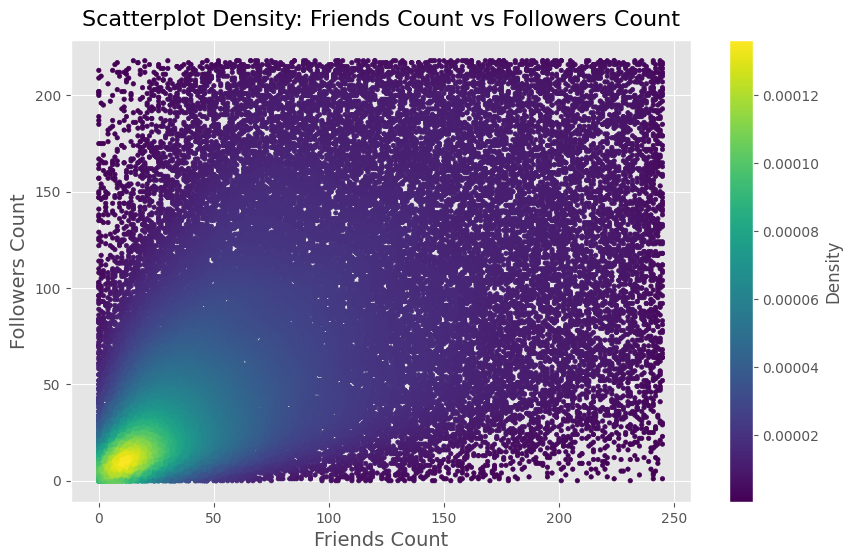

In [62]:
# 3 min to calculate kde
fw_q3 = temp['followersCount'].quantile(0.4)
fr_q3 = temp['friendsCount'].quantile(0.4)

temp2 = temp[(temp['followersCount'] < fw_q3) & (temp['friendsCount'] < fr_q3)]
x2y2 = np.vstack([temp2['friendsCount'], temp2['followersCount']])
z2 = gaussian_kde(x2y2)(x2y2)

plt.figure(figsize=(10, 6))
scatter = plt.scatter(
    temp2['friendsCount'], temp2['followersCount'], c=z2, cmap='viridis', s=10, edgecolor=None
)

plt.colorbar(scatter, label="Density")
plt.title("Scatterplot Density: Friends Count vs Followers Count", fontsize=16, pad=10)
plt.xlabel("Friends Count", fontsize=14)
plt.ylabel("Followers Count", fontsize=14)
plt.grid(True)
plt.savefig("scatter_density_plot.png")
plt.show()


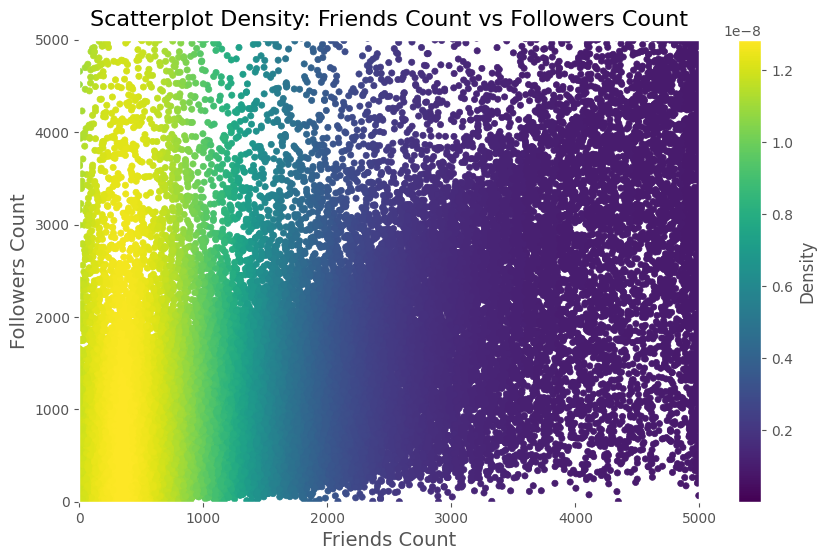

In [61]:
#from scipy.stats import gaussian_kde
#7 min to calculate kde

xy = np.vstack([temp['friendsCount'], temp['followersCount']])
#z = gaussian_kde(xy)(xy)

plt.figure(figsize=(10, 6))
scatter = plt.scatter(
    temp['friendsCount'], temp['followersCount'], c=z, cmap='viridis', s=20, edgecolor=None
)

plt.colorbar(scatter, label="Density")
plt.xlim(0, 5000)
plt.ylim(0, 5000)

plt.title("Scatterplot Density: Friends Count vs Followers Count", fontsize=16, pad=10)
plt.xlabel("Friends Count", fontsize=14)
plt.ylabel("Followers Count", fontsize=14)
plt.grid(True)
plt.savefig("scatter_density_plot.png", format = 'png')
plt.show()




####Trying to differentiate two/ three groups from this very noisy joint distribution.
The square near the origin it looks almost uniformally distributed with 0 correlation so I tried to eliminate this data from the plot and visualize what looked two different groups based on correlation. The first near near the Y axis looks like an inverse correlation pattern and the one near the y=x bisector line looks like a positive correlation pattern. \
In the future me or someone else could try to explain this statistically.

In [1]:
#import plotly.graph_objects as go
cut_point = 7510
#cut_point = 3800 # chosen visually to cut data at 3800 because it looks almost like a 2-d uniform variable
# possible improvement finding cut point analyzing the cumulatives conditional entropy: H(Y| X < z) and H(X | Y < z)
# Good cutting point should have low entropies and maximise the number of points to cut.
# Another statistic to watch could be KL-divergence with a uniform random variable.

temp_cut = temp[(temp['followersCount'] >= cut_point) | (temp['friendsCount'] >= cut_point)]

x = temp_cut['friendsCount'].values.reshape(-1, 1)
y = temp_cut['followersCount'].values


x_range = np.linspace(x.min(), (10**7 - 226.3)/ 0.92764378, 200)
x_near_axis = np.linspace(0.0000001, 1, 200)
y_reciprocal = 1 / x_near_axis  # Calculate y = 1/x

# Create the scatter plot
fig = go.Figure()

# Add scatter points
fig.add_trace(go.Scatter(
    x=temp_cut['friendsCount'],
    y=temp_cut['followersCount'],
    mode='markers',
    marker=dict(color='#95CF95', opacity=0.32),
    name='Data Points'
))

#lower bound on correlation for directly correlated group
#data doesn't go under this line
fig.add_trace(go.Scatter(
    x=x_range,
    y=0.92764378*x_range + 226.3,
    mode='lines',
    line=dict(color='red', width=2, dash='dash'),
    name='y = 0.92764378x + 226.3'
))

# inversely correlated group line
fig.add_trace(go.Scatter(
    x=x_near_axis,
    y=y_reciprocal,
    mode='lines',
    line=dict(color='red', width=2, dash='dash'),
    name='y = 1/x'
))

fig.update_yaxes(type="linear", scaleanchor="x", scaleratio=1) #to keep the same scale for both axes.

fig.update_layout(
    title="Scatter Plot of cleaned data",
    xaxis=dict(title="Friends Count"),
    yaxis=dict(title="Followers Count"),
    template="ggplot2",
    width=1000,
    height=1000,
    showlegend=True
)

fig.show()


NameError: name 'temp' is not defined